# <span style='color:pink'> pakiety matematyczne - projekt  </span>
## <span style='color:pink'> Funkcja IDFT (tydzień 2)  </span>

In [1]:
using WAV
using Plots
using FFTW
using OffsetArrays

Funkcja DFT z poprzedniego tygodnia

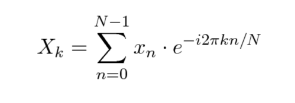

In [2]:
function dft(signal)
    N = length(signal)
    zeta_powers = OffsetArray([exp( -2π *  im * n / N) for n in 0:(N-1) ], 0:(N-1))
    [  sum( signal[n + 1] * zeta_powers[(n * f) % N] for n in 0:(N-1)   ) for f in 0:(N-1) ]
end

dft (generic function with 1 method)

Funkcja odwrotna do DFT

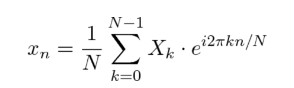

In [3]:
function idft(signal)
    N = length(signal)
    zeta_powers = OffsetArray([exp( 2π *  im * n / N) for n in 0:(N-1) ], 0:(N-1))
    [  (1/N)*sum( signal[n + 1] * zeta_powers[(n * f) % N] for n in 0:(N-1)   ) for f in 0:(N-1) ]
end

idft (generic function with 1 method)

Testy w oparciu o nagranie dźwięku ptaka

In [5]:
bird = wavread("bird_sound.wav")

([0.0018616290780358287 0.0032349620044557024; -0.0006103701895199438 0.0005493331705679495; … ; 0.0017090365306558428 -0.0008239997558519242; 0.001281777397991882 -0.0004882961516159551], 22050.0f0, 0x0010, WAVChunk[WAVChunk(Symbol("fmt "), UInt8[0x10, 0x00, 0x00, 0x00, 0x01, 0x00, 0x02, 0x00, 0x22, 0x56, 0x00, 0x00, 0x88, 0x58, 0x01, 0x00, 0x04, 0x00, 0x10, 0x00]), WAVChunk(:LIST, UInt8[0x49, 0x4e, 0x46, 0x4f, 0x49, 0x41, 0x52, 0x54, 0x10, 0x00  …  0x35, 0x38, 0x2e, 0x34, 0x35, 0x2e, 0x31, 0x30, 0x30, 0x00])])

In [12]:
plot(bird[1][:,1], linecolor = :orchid1, label =:none, xlabel = "czas", ylabel= "amplituda")

In [7]:
fft_bird =fft(bird[1][:,1])
dft_bird = dft(bird[1][:,1])

166896-element Array{Complex{Float64},1}:
 0.0032959990234077653 + 0.0im
 0.0074493539381720805 + 0.0019417631441831832im
  0.005067716353094773 - 0.0011863094962057967im
  0.005997118205185043 + 0.0005523853106264404im
  0.007247459274519571 - 0.0020149318524465545im
   0.00299222516928134 - 0.003719024053981211im
  0.005623961993831007 + 0.0001509646427136821im
  0.003789898311736867 - 0.0002338453080777309im
  0.009365022518014614 + 0.000622374443503693im
  0.008596819499371175 - 0.002327852476061692im
   0.00857109157885477 + 0.001768596243440269im
  0.006065352893679318 - 0.0033105796017401513im
   0.00882281911859852 - 0.001031130382546552im
                       ⋮
  0.008822819118598387 + 0.0010311303825464412im
  0.006065352893679221 + 0.0033105796017399744im
  0.008571091578854615 - 0.00176859624344035im
  0.008596819499370932 + 0.0023278524760614824im
  0.009365022518014597 - 0.0006223744435038396im
 0.0037898983117367144 + 0.00023384530807778813im
  0.005623961993831057 - 0

In [13]:
plot(abs.(dft_bird), x_lims = (0,20000), label = "DFT")
plot!(abs.(fft_bird), x_lims = (0,20000), label = "FFT")

In [10]:
ifft_bird = ifft(fft_bird)
idft_bird = idft(dft_bird)

166896-element Array{Complex{Float64},1}:
   0.0018616290780358253 + 6.481435372226495e-18im
   -0.000610370189519915 - 3.812464519492765e-18im
    -0.00158696249275184 - 1.3626454756028571e-19im
  -0.0013122959074678808 - 2.24031939919549e-18im
  -0.0008239997558519756 - 4.303815412729746e-18im
  -0.0005188146610919756 - 8.558291623201634e-18im
    0.000518814661091987 + 5.46284946653832e-18im
   0.0016479995117038607 - 1.867752879004583e-18im
   0.0016785180211798666 - 2.5835643363302993e-18im
   0.0010681478316598386 - 1.6621172181815244e-18im
   0.0003357036042359361 + 3.447700024570019e-18im
   0.0003357036042360029 - 2.9004460936622332e-18im
   0.0002746665852840209 + 2.637456127520653e-18im
                         ⋮
    0.001892147587511859 + 2.9995662448209415e-18im
    0.000976592303231924 - 8.341795491235102e-18im
    -0.00100711081270793 + 2.571991873538706e-19im
  -0.0012207403790399376 + 2.4705317644269655e-18im
    0.000762962736899927 - 1.626994462299058e-18im
   0.0021

IFFT (i tym samym IDFT) zwraca nam listę liczb zespolonych, aby otrzymać to co mieliśmy na wyjściu trzeba wziąć część rzeczywistą (real)

In [65]:
plot(bird[1][:,1], linecolor = :orchid1, label ="początkowy dźwięk", xlabel = "czas", ylabel= "amplituda")
plot!(real.(idft_bird), x_lims = (0,20000), label="IFFT")
plot!(real.(ifft_bird), x_lims = (0,20000), label="DFT")

Jak można posłuchać, otrzymane nagrania brzmią tak samo! :D

In [71]:
wavplay(real.(ifft_bird), bird[2])

In [75]:
wavplay(bird[1][:,1], bird[2])

In [74]:
wavplay(real.(idft_bird), bird[2])

I tu jeszcze sprawdzenie czy na pewno są przybliżone

In [77]:
isapprox(bird[1][:,1], real.(idft_bird))

true

In [76]:
isapprox(real.(idft_bird), real.(ifft_bird))

true

I są!

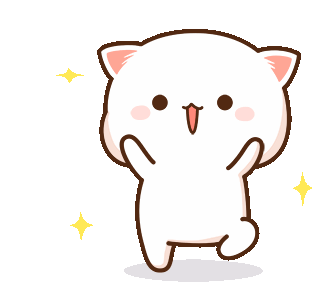